In [1]:
import choclo

In [2]:
import numpy as np
import ray
import matplotlib.pyplot as plt

try:
    ray.shutdown()
except:
    pass

ncores = 6
ray.init(num_cpus = ncores)

2023-12-16 17:13:08,897	INFO worker.py:1673 -- Started a local Ray instance.


Python version:,3.10.13
Ray version:,2.8.1


In [3]:
def reshape_function(w, model_shapes):
    reshape_w = []
    indx = 0
    for shape in model_shapes:
        num = np.prod(shape)
        x = w[indx:num+indx]
        if x.size!=num:
            continue
        x = x.reshape(shape)
        reshape_w.append(x)
        indx = indx+num
    extra_w = w[indx:].reshape(-1,1)
    return reshape_w



def softmax(x):
#     print(np.exp(x - np.max(x, axis=0).reshape(1, -1)))
    """Compute softmax values for each sets of scores in x."""
    e_x = np.exp(x - np.max(x, axis=1).reshape(-1, 1))
    return e_x / e_x.sum(axis=1).reshape(-1, 1) # only difference

def softmax(x):
#     print(np.exp(x - np.max(x, axis=0).reshape(1, -1)))
    """Compute softmax values for each sets of scores in x."""
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum()

def sample_integers(x, vals):
    
    y = np.nan_to_num(x.copy(), 0) #+ np.random.uniform(-1e-6, 1e-6, size=x.shape)
    y = softmax(y)
    y[:, np.array(vals)==0] += 1 - np.sum(y,axis=1).reshape(-1, 1)
    
    sample = []
    for row in y:
        
        v = np.random.choice(vals, p = row)
        sample.append(v)
    
    return np.array(sample)

def loss_fcn(X,y,w,args):
    
    args = dict(args)
    model_shapes = args['model_shapes']

    w_tensor = reshape_function(w,model_shapes)
    
    loss = 0
    sample_size = X.shape[0]

    
    
    for indx in range(X.shape[0]):
        
        D = X[indx:indx+1].flatten()
        
        x_2 = w_tensor[0]
        y_2 = w_tensor[1]
        z_2 = w_tensor[2]
        x_1 = w_tensor[3]
        y_1 = w_tensor[4]
        z_1 = w_tensor[5]
        
        crossD = np.array([D[i]*D[j] for i in range(D.shape[0]) for j in range(D.shape[0]) if j >= i])
        
        dx = np.sum(crossD*x_2.flatten()) + np.sum(D.flatten()*x_1.flatten())
        dy = np.sum(crossD*y_2.flatten()) + np.sum(D.flatten()*y_1.flatten())
        dz = np.sum(crossD*z_2.flatten()) + np.sum(D.flatten()*z_1.flatten())

        newD = D + np.array([dx, dy, dz])

        loss += np.sum(np.abs(newD-y[indx:indx+1].flatten())/np.abs(y[indx:indx+1].flatten())) / sample_size
        
    return np.log(loss+1)

def mini_batch_random_choice(X,y,batch_size):
    rand_sample = np.random.randint(0, X.shape[0] - batch_size - 1 )
    X_batch = X[rand_sample:rand_sample+batch_size]
    y_batch = y[rand_sample:rand_sample+batch_size]
    return X_batch,y_batch

@ray.remote
def map_losses(X, y, w_list, w_indx, args):
    
    args = dict(args)
    seed = args['seed'][0]
    
    np.random.seed(seed)
    X_batch, y_batch = mini_batch_random_choice(X, y, 200)

    N = w_indx.shape[0]
    resX = np.zeros(N)
    iter_ = 0
    for i in w_indx:
        loss = loss_fcn(X_batch, y_batch, w_list[:,i:i+1], args)
        resX[iter_] = loss
        iter_+=1
    return resX
    
    
def ray_parallel_mapper(X,y,w_list,args):
    
    weights_index = np.arange(0,w_list.shape[1])
    weights_index_split = np.array_split(weights_index, ncores)
    
    w_list_id = ray.put(w_list)
    
    result_ids = [map_losses.remote(X_id,y_id,w_list_id,weights_index_split[i],args_id) for i in range(ncores)]
    result = ray.get(result_ids)
    
    loss = []
    indx = []
    for l in result:
        loss.extend(l)
    loss = np.hstack(loss)
    return loss


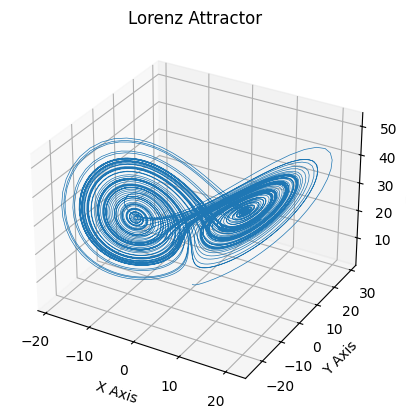

In [374]:
def lorenz(xyz, *, s=10, r=28, b=2.667):
    """
    Parameters
    ----------
    xyz : array-like, shape (3,)
       Point of interest in three-dimensional space.
    s, r, b : float
       Parameters defining the Lorenz attractor.

    Returns
    -------
    xyz_dot : array, shape (3,)
       Values of the Lorenz attractor's partial derivatives at *xyz*.
    """
    x, y, z = xyz
    x_dot = s*(y - x)
    y_dot = r*x - y - x*z
    z_dot = x*y - b*z
    return np.array([x_dot, y_dot, z_dot])

# 00, 01, 02, 11, 12, 22
init_2nd = [
    [ 0, 0, 0, 0, 0, 0],
    [ 0, 0, -1.0, 0, 0, 0],
    [ 0, 1.0, 0, 0, 0, 0]
]
# 0, 1, 1
init_1st = [
    [-10, 10, 0],
    [28, -1.0, 0],
    [0, 0, -2.667]
]

init_vars = []
for vl in init_2nd:
    for v in vl:
        init_vars.append(v)
for vl in init_1st:
    for v in vl:
        init_vars.append(v)
        

init_vars = np.array(init_vars)


dt = 0.01
num_steps = 10000

data = np.empty((num_steps + 1, 3))  # Need one more for the initial values
data[0] = (0., 1., 1.05)  # Set initial values

# Step through "time", calculating the partial derivatives at the current point
# and using them to estimate the next point
for i in range(num_steps):
    data[i + 1] = data[i] + lorenz(data[i].copy()) * dt

# Plot
ax = plt.figure().add_subplot(projection='3d')

ax.plot(*data.T, lw=0.5)
ax.set_xlabel("X Axis")
ax.set_ylabel("Y Axis")
ax.set_zlabel("Z Axis")
ax.set_title("Lorenz Attractor")

plt.show()

In [5]:
D = np.array([0, 1, 2])
crossD = np.array([f"{D[i]}*{D[j]}" for i in range(D.shape[0]) for j in range(D.shape[0]) if j >= i])
crossD

array(['0*0', '0*1', '0*2', '1*1', '1*2', '2*2'], dtype='<U3')

In [6]:
init_vars

array([  0.   ,   0.   ,   0.   ,   0.   ,   0.   ,   0.   ,   0.   ,
         0.   ,  -1.   ,   0.   ,   0.   ,   0.   ,   0.   ,   1.   ,
         0.   ,   0.   ,   0.   ,   0.   , -10.   ,  10.   ,   0.   ,
        28.   ,  -1.   ,   0.   ,   0.   ,   0.   ,  -2.667])

In [7]:
#prior sampler (default)
def prior_sampler_uniform_distribution(kmldata):
    random_samples = kmldata.prior_random_samples
    num_params = kmldata.number_of_parameters

    means = init_vars*dt
    vars = np.abs(means)/12 + 0.001

    result_stack = []
    for mu, sigma in zip(means, vars):

        sample = np.random.normal(mu, sigma, size=(random_samples))
        result_stack.append(sample)

    result_stack = np.vstack(result_stack)
    return result_stack

def clip_parameter_transform(w,*args):
    v = w[:uniq_dim*3*3]
    v = np.clip(v,-1,1)
    w[:uniq_dim*3*3] = v 
    # w[rows,columns] = (parameter set,iteration)
    return w

In [8]:
uniq_dim = int(data.shape[1]*(data.shape[1]+1)/2)

model_shapes = [(uniq_dim, ), (uniq_dim, ), (uniq_dim, ), (3, ), (3, ), (3, )]

input_num = uniq_dim*3 + 3*3

int(np.sqrt(input_num))

5

In [9]:
import copy

In [10]:
uniq_dim = int(data.shape[1]*(data.shape[1]+1)/2)

model_shapes = [(uniq_dim, ), (uniq_dim, ), (uniq_dim, ), (3, ), (3, ), (3, )]

input_num = uniq_dim*3 + 3*3

zscore=2.0
realizations = 10
cycles = 3
volume = 100
simulations = 2056
volatility = 1.0

saved_seed = 0
X = data[:-1]
y = data[1:]


saved_runs = []
for _ in range(6):

    
    saved_realizations = []
    choclo_saved_data = None

    for seed in range(saved_seed, saved_seed+20):

        kml0 = choclo.ChocloOptimizer(ray_parallel_mapper,
                         prior_sampler_fcn = prior_sampler_uniform_distribution,
                         posterior_sampler_fcn=None,
                         intermediate_sampler_fcn=None,
                         parameter_transform_fcn=None,
                         batch_size=None)

        if choclo_saved_data is not None:
            kml0.load_choclo_data(choclo_saved_data)

        args = {'model_shapes':model_shapes,
                       'seed': [seed],
                      }

        args = np.array(list(args.items()), dtype="object")


        X_id = ray.put(X)
        y_id = ray.put(y)
        args_id = ray.put(args)

        kml0.optimize(X,y,
                                        number_of_parameters=input_num,
                                        args=[args],
                                        number_of_realizations=realizations,
                                        number_of_random_simulations =simulations,
                                        update_volatility = volatility,
                                        number_of_cycles=cycles,
                                        update_volume=volume,
                                        convergence_z_score=zscore,
                                        prior_uniform_low=-0.001,
                                        prior_uniform_high=0.001,
                                        print_feedback=True)

        choclo_saved_data = copy.copy(kml0.choclo_data)

        saved_realizations.append(choclo_saved_data)
        
    saved_seed = seed
    saved_runs.append(saved_realizations)


realization 0 loss 0.047229382632473976 time 23.56791925430298
realization 1 loss 0.03201474810674862 time 22.470136880874634
realization 2 loss 0.018646281307931015 time 22.340068101882935
realization 3 loss 0.011311332760408636 time 22.394251585006714
realization 4 loss 0.010077602165629912 time 22.335492849349976
realization 5 loss 0.008934851698343916 time 22.32312798500061
realization 6 loss 0.007566100634919748 time 22.312849760055542
realization 7 loss 0.007074935650212558 time 22.951346158981323
realization 8 loss 0.006626141644897248 time 22.472697973251343
realization 9 loss 0.006358430996001088 time 22.410239934921265
realization 0 loss 0.003120722095158768 time 22.578101634979248
realization 1 loss 0.002974878266008556 time 22.319629192352295
realization 2 loss 0.0028961821625516086 time 22.31017303466797
realization 3 loss 0.0028366398198195384 time 22.4045729637146
realization 4 loss 0.0027998162217446124 time 22.252631664276123
realization 5 loss 0.0027778935831393697 t

In [9]:
import pickle

In [10]:
# pickle.load?

In [11]:
# with open('saved_runs_0.pkl', 'wb') as fh:
#     pickle.dump(saved_runs, fh)

In [12]:
with open('saved_runs_0.pkl', 'rb') as fh:
    saved_runs_ = pickle.load(fh)

In [13]:
saved_realizations = saved_runs_[-1]

In [17]:
# import pandas as pd


# w_cols = [f"w{i}" for i in range(27)]

# df = pd.DataFrame(columns=['loss']+w_cols)

In [19]:
tmp = []
count = 0
for sr in saved_realizations:

    loss_indx = np.argsort(sr.loss_by_realization.flatten())[:5]
    # kml0.choclo_data.update_by_realization
    losses = sr.loss_by_realization.flatten()[loss_indx]
    updates = sr.update_by_realization[loss_indx]

    for loss, w in zip(losses, updates):
        # print(w)
        # df.loc[count] = [loss]+list(w)
        # count+=1
    # print(reshape_function(w, model_shapes))
    # print()
        tmp.append(w[:, np.newaxis])
# w = reshape_function(w, model_shapes)

In [22]:
# np.any(np.all(x==updates_remove_duplicates, axis=1))

In [23]:



current_losses = []
current_updates = []

for saved_realization_ in saved_runs_:

    for sr in saved_realization_:
        losses = sr.loss_by_realization.flatten()
        updates = sr.update_by_realization
        
        current_losses.append(losses)
        current_updates.append(updates)

global_losses = []
global_updates = []

current_losses = np.concatenate(current_losses, axis=0)
current_updates = np.concatenate(current_updates, axis=0)

loss_indx = np.argsort(current_losses)
losses = current_losses[loss_indx]
updates = current_updates[loss_indx]
for loss, update in zip(losses, updates):
    if len(global_updates)>0:
        if np.any(np.all(update == global_updates, axis=1)):
            continue
            
    global_updates.append(update)
    global_losses.append(loss)
        # print(x)

In [331]:
np.mean(current_updates[:30],axis=0).round(3)

array([ 0.   ,  0.   ,  0.   , -0.001, -0.   , -0.   ,  0.001, -0.002,
       -0.01 ,  0.001,  0.   , -0.   , -0.003,  0.012, -0.   , -0.   ,
       -0.   ,  0.   , -0.1  ,  0.104,  0.003,  0.279, -0.009,  0.001,
       -0.004,  0.005, -0.028])

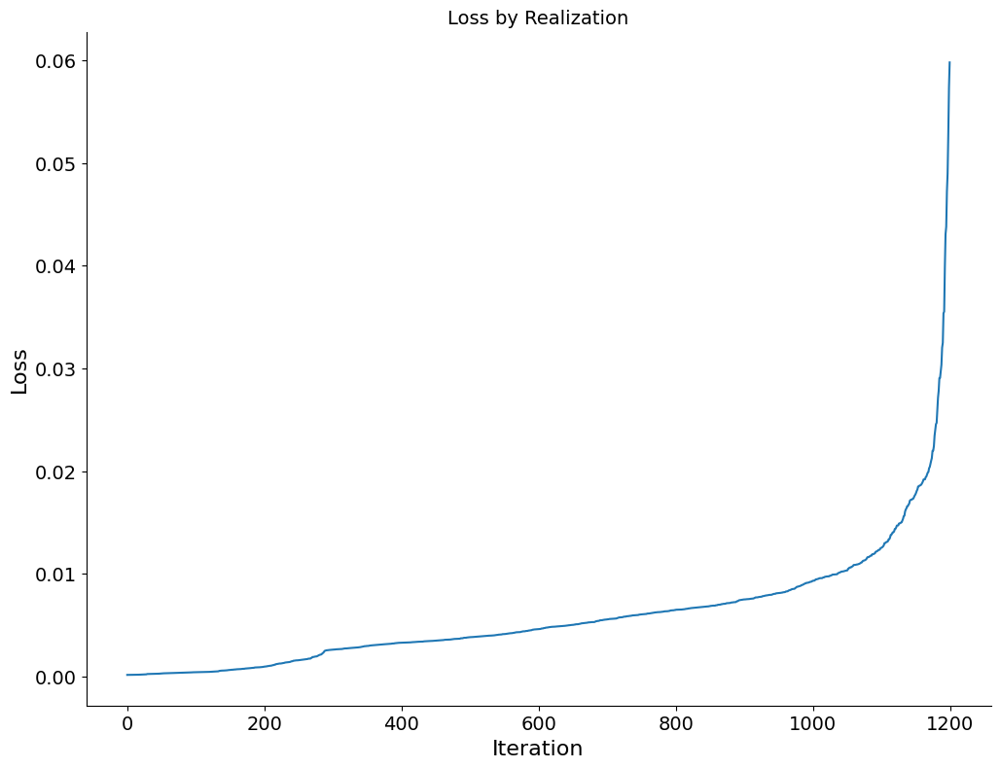

In [253]:
plt.figure(figsize=(12, 9))
ax = plt.subplot(111)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
    
plt.xticks(fontsize=14)  
plt.yticks(fontsize=14) 

plt.plot(global_losses)
plt.title(f"Loss by Realization", fontsize=14)
plt.xlabel("Iteration", fontsize=16)
plt.ylabel("Loss", fontsize=16)
plt.show()
plt.show()

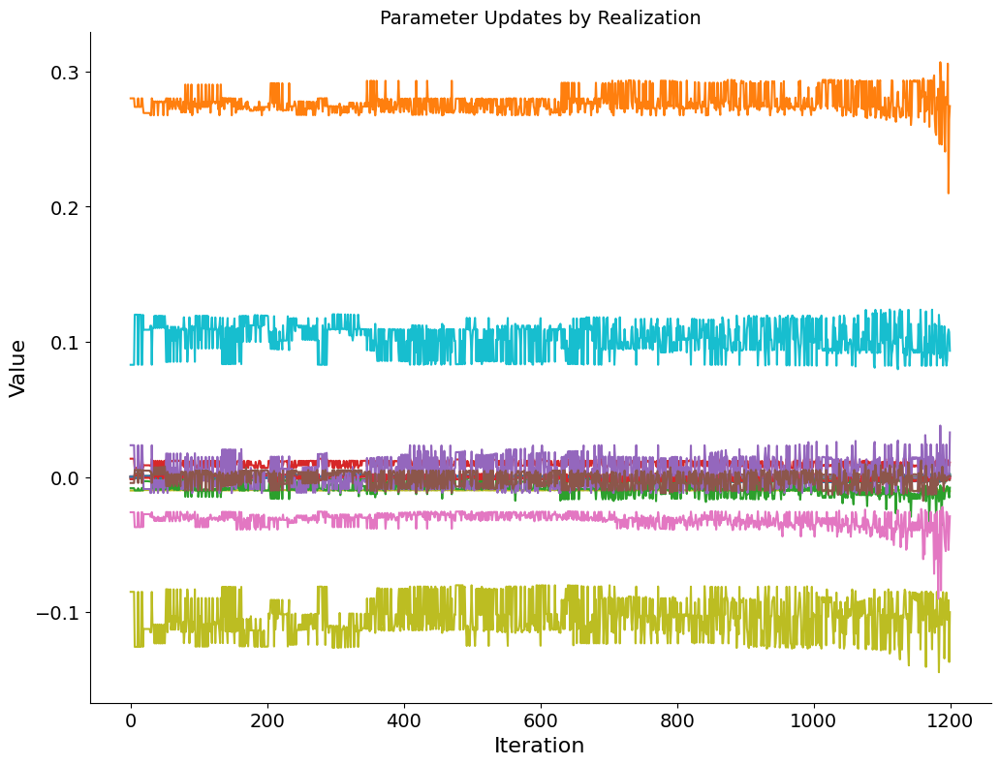

In [252]:
plt.figure(figsize=(12, 9))
ax = plt.subplot(111)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
    
plt.xticks(fontsize=14)  
plt.yticks(fontsize=14) 

plt.plot(global_updates)
plt.title(f"Parameter Updates by Realization", fontsize=14)
plt.xlabel("Iteration", fontsize=16)
plt.ylabel("Value", fontsize=16)
plt.show()
plt.show()

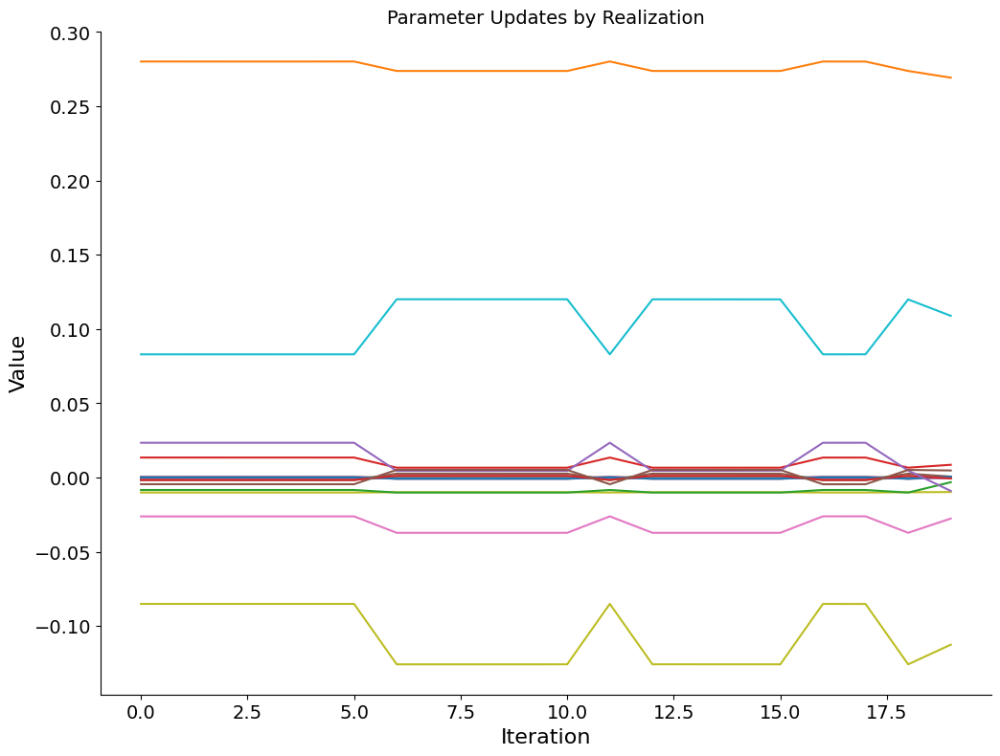

In [333]:
plt.figure(figsize=(12, 9))
ax = plt.subplot(111)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
    
plt.xticks(fontsize=14)  
plt.yticks(fontsize=14) 

plt.plot(global_updates[:20])
plt.title(f"Parameter Updates by Realization", fontsize=14)
plt.xlabel("Iteration", fontsize=16)
plt.ylabel("Value", fontsize=16)
plt.show()
plt.show()

In [26]:
# tmp = []

# for sr in saved_realizations[0:1]:
#     loss_indx = np.argsort(sr.loss_by_realization.flatten())[:5]
#     # kml0.choclo_data.update_by_realization

#     w = np.mean(sr.update_by_realization[loss_indx], axis=0)
#     print(reshape_function(w, model_shapes))
#     print()
#     tmp.append(w[:,np.newaxis])
# # w = reshape_function(w, model_shapes)

In [28]:
# np.concatenate(tmp,axis=1).var(axis=0)

In [29]:
# w = np.mean(np.concatenate(tmp,axis=1),axis=1)
# 

In [30]:

# w = reshape_function(w, model_shapes)

In [339]:
len(root_losses)/len(global_losses)

0.9991666666666666

In [221]:
from scipy.optimize import fsolve
def find_roots(D, args):

    D = np.array(D)
    w_tensor = reshape_function(args, model_shapes)
    x_2 = w_tensor[0]
    y_2 = w_tensor[1]
    z_2 = w_tensor[2]
    x_1 = w_tensor[3]
    y_1 = w_tensor[4]
    z_1 = w_tensor[5]

    crossD = np.array([D[i]*D[j] for i in range(D.shape[0]) for j in range(D.shape[0]) if j >= i])

    dx = np.sum(crossD*x_2.flatten()) + np.sum(D.flatten()*x_1.flatten())
    dy = np.sum(crossD*y_2.flatten()) + np.sum(D.flatten()*y_1.flatten())
    dz = np.sum(crossD*z_2.flatten()) + np.sum(D.flatten()*z_1.flatten())

    # print([dx, dy, dz])
    return [dx, dy, dz]

def apply_w(X, w_tensor):
        
    D = X
    x_2 = w_tensor[0]
    y_2 = w_tensor[1]
    z_2 = w_tensor[2]
    x_1 = w_tensor[3]
    y_1 = w_tensor[4]
    z_1 = w_tensor[5]

    crossD = np.array([D[i]*D[j] for i in range(D.shape[0]) for j in range(D.shape[0]) if j >= i])

    dx = np.sum(crossD*x_2.flatten()) + np.sum(D.flatten()*x_1.flatten())
    dy = np.sum(crossD*y_2.flatten()) + np.sum(D.flatten()*y_1.flatten())
    dz = np.sum(crossD*z_2.flatten()) + np.sum(D.flatten()*z_1.flatten())

    newD = D + np.array([dx, dy, dz])
    return newD


def run_attractor(row, w):
    n = 10000
    result = [row]
    w_tensor = reshape_function(w, model_shapes)
    # print(w_tensor)
    for _ in range(n):
        row = apply_w(row, w_tensor)
        row = np.array(row)
    
        result.append(row)

    result = np.array(result)
    return result

ρ = 28
σ = 10
β = 2.667

start = np.array([0., 1., 1.05])

valid_losses = []
valid_updates = []
valid_roots = []
valid_dist = []

for loss, w in zip(global_losses, global_updates):

    result = run_attractor(start, w)

    if any(np.isnan(result[-1])):
        print('invalid nan')
        continue

    if any(result[-1]>1e6):
        print('invalid unstable')
        continue
    
    root_1 = fsolve(find_roots, [np.sqrt(β*(ρ-1)), np.sqrt(β*(ρ-1)), ρ-1], args=(w), xtol = 1e-13, factor = 0.0001, maxfev=5500, full_output=True)
    root_2 = fsolve(find_roots, [-np.sqrt(β*(ρ-1)), -np.sqrt(β*(ρ-1)), ρ-1], args=(w), xtol = 1e-13, factor = 0.0001, maxfev=5500, full_output=True)
    
    status_1 = root_1[2]
    root_1 = root_1[0]
    
    status_2 = root_2[2]
    root_2 = root_2[0]

    if status_1 != 1 or status_2 != 1:
        print('invalid root')
        continue
        
    valid_losses.append(loss)
    valid_updates.append(w)
    valid_roots.append((root_1, root_2))
    valid_dist.append(result)


C:\Users\rohan\AppData\Local\Temp\ipykernel_7544\2825479148.py:11: RuntimeWarning:

overflow encountered in scalar multiply

C:\Users\rohan\anaconda3\envs\datar\lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning:

invalid value encountered in reduce



invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan
invalid nan


In [336]:
[np.sqrt(β*(ρ-1)), np.sqrt(β*(ρ-1)), ρ-1], [-np.sqrt(β*(ρ-1)), -np.sqrt(β*(ρ-1)), ρ-1]

([8.485811687752681, 8.485811687752681, 27],
 [-8.485811687752681, -8.485811687752681, 27])

In [223]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
import plotly

layout = go.Layout(
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)




data = []
count = 0
N = len(valid_updates)
valid_starts = []

for indx in range(N):

    w = valid_updates[indx]
    
    row = start

    
    result = run_attractor(row, w)

    if any(np.isnan(result[-1])):
        print('invalid nan')
        continue

    if any(result[-1]>1e6):
        print('invalid unstable')
        continue
        
    # print(result[0])
    
    X_surface = result[:,0]
    Y_surface = result[:,1]
    Z_surface = result[:,2]

    root_1 = fsolve(find_roots, [np.sqrt(β*(ρ-1)), np.sqrt(β*(ρ-1)), ρ-1], args=(init_vars), xtol = 1e-13, factor = 0.0001, maxfev=5500, full_output=True)
    root_2 = fsolve(find_roots, [-np.sqrt(β*(ρ-1)), -np.sqrt(β*(ρ-1)), ρ-1], args=(init_vars), xtol = 1e-13, factor = 0.0001, maxfev=5500, full_output=True)
    
    status_1 = root_1[2]
    root_1 = root_1[0]
    
    status_2 = root_2[2]
    root_2 = root_2[0]

    if status_1 != 1 or status_2 != 1:
        print('invalid root')
        continue

    valid_starts.append(list(row))
    
    point1 = np.array([root_1])
    
    point2 = np.array([root_2])
    
    color = np.hstack([((result-point1)**2).sum(axis=1)[:, np.newaxis], ((result-point2)**2).sum(axis=1)[:, np.newaxis]])
    color = color.min(axis=1)
    clip_val = min(1024, 3*color.std())
    
    color = color.clip(0, clip_val)
    fig = go.Figure(data=[],layout=layout)
    
    fig.update_layout(paper_bgcolor="rgba(0,0,0,0)", plot_bgcolor="rgba(0,0,0,0)")
    fig.update_scenes(xaxis_visible=False, yaxis_visible=False,zaxis_visible=False )
    
    fig.add_trace(go.Scatter3d(x=X_surface, y=Y_surface, z=Z_surface, marker=dict(
                    size=2,
                    color=color,
                    colorscale='hsv',    
                    ),
                    line=dict(
                        color=color,
                        colorscale='hsv',
                        width=2)
                        
                     )
                 )

    angle = 2*np.pi/3
    camera = dict(
        up=dict(x=0, y=0, z=1),
        center=dict(x=0, y=0, z=0),
        eye=dict(x=2*np.cos(angle), y=2*np.sin(angle), z=0.1)
    )
    
    fig.update_layout(scene_camera=camera)
    
    plotly.io.write_image(fig, f'D:/chaotic_attractor/lorenz_update_video/{count}.png', format=None, scale=None, width=None, height=None, validate=True, engine='auto')
    
    count+=1


In [319]:
def pretty_print(w_tensor):

    def zip_mult_str(X, W):
        result = ""
        for x, w in zip(X, W):
            result += f"{round(x, 3)}*{w} + "
        return result
    
    x_2 = w_tensor[0]
    y_2 = w_tensor[1]
    z_2 = w_tensor[2]
    x_1 = w_tensor[3]
    y_1 = w_tensor[4]
    z_1 = w_tensor[5]

    D = np.array(["X", "Y", "Z"])
    crossD = [f"{D[i]}*{D[j]}" for i in range(D.shape[0]) for j in range(D.shape[0]) if j >= i]

    print("dX = " + zip_mult_str(x_1, D) + zip_mult_str(x_2, crossD)[:-3])
    print("dY = " + zip_mult_str(y_1, D) + zip_mult_str(y_2, crossD)[:-3])
    print("dZ = " + zip_mult_str(z_1, D) + zip_mult_str(z_2, crossD)[:-3])
    
pretty_print(reshape_function(init_vars, model_shapes))

dX = -10.0*X + 10.0*Y + 0.0*Z + 0.0*X*X + 0.0*X*Y + 0.0*X*Z + 0.0*Y*Y + 0.0*Y*Z + 0.0*Z*Z
dY = 28.0*X + -1.0*Y + 0.0*Z + 0.0*X*X + 0.0*X*Y + -1.0*X*Z + 0.0*Y*Y + 0.0*Y*Z + 0.0*Z*Z
dZ = 0.0*X + 0.0*Y + -2.667*Z + 0.0*X*X + 1.0*X*Y + 0.0*X*Z + 0.0*Y*Y + 0.0*Y*Z + 0.0*Z*Z


In [276]:
root_1_mae = np.mean(np.abs(np.array([ x[0] for x in valid_roots]) - np.array([[np.sqrt(β*(ρ-1)), np.sqrt(β*(ρ-1)), ρ-1]])), axis=1)

root_2_mae = np.mean(np.abs(np.array([ x[1] for x in valid_roots]) - np.array([[-np.sqrt(β*(ρ-1)), -np.sqrt(β*(ρ-1)), ρ-1]])), axis=1)

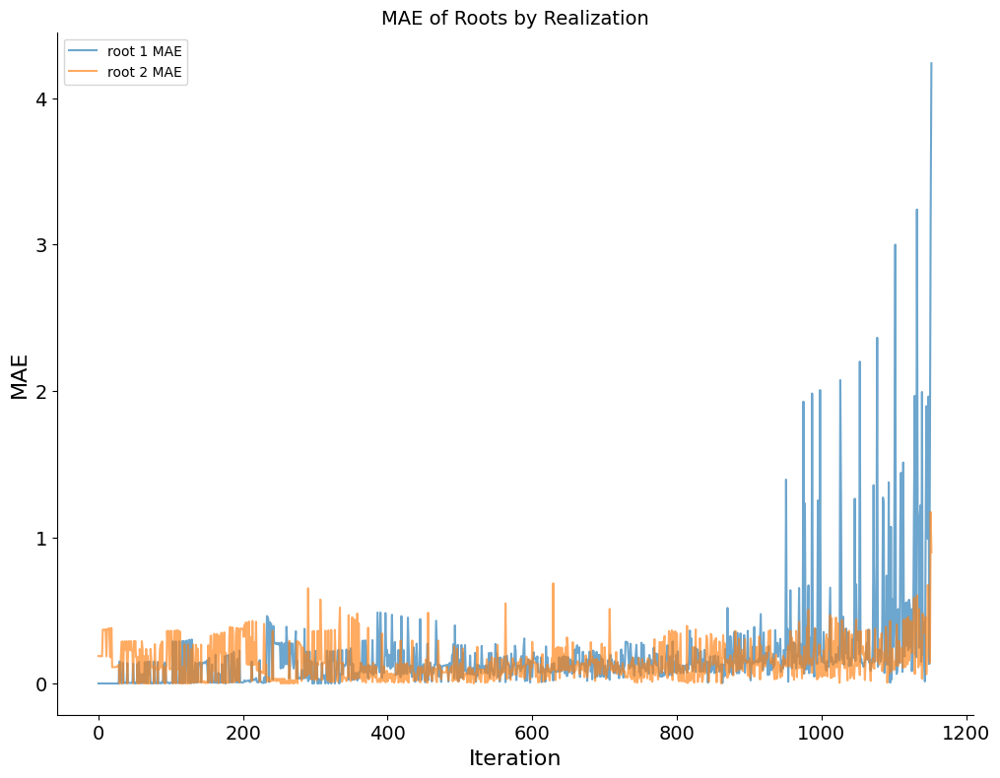

In [317]:
plt.figure(figsize=(12, 9))
ax = plt.subplot(111)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
    
plt.xticks(fontsize=14)  
plt.yticks(fontsize=14) 

plt.plot(root_1_mae, label='root 1 MAE', alpha=0.65)

plt.plot(root_2_mae, label='root 2 MAE', alpha=0.65)

plt.legend()
plt.title(f"MAE of Roots by Realization", fontsize=14)
plt.xlabel("Iteration", fontsize=16)
plt.ylabel("MAE", fontsize=16)
plt.show()
plt.show()
# plt.plot(np.array([ x[1] for x in valid_roots]))

In [310]:
np.argmin(root_2_mae)

262

In [298]:
np.argmax(root_2_mae)

1151

In [303]:
np.argmax(root_1_mae+root_2_mae)

1152

In [314]:
np.argsort(root_1_mae+root_2_mae)[:10]

array([452, 498, 522, 484, 555, 597, 618, 474, 461, 236], dtype=int64)

In [301]:
# Smallest Root 1 MAE
pretty_print(reshape_function(valid_updates[27]/dt, model_shapes))

dX = -11.25*X + 10.891*Y + 0.063*Z + 0.036*X*X + -0.063*X*Y + 0.048*X*Z + 0.029*Y*Y + -0.033*Y*Z + -0.003*Z*Z
dY = 26.928*X + -0.328*Y + -0.057*Z + -0.028*X*X + 0.035*X*Y + -0.972*X*Z + -0.006*Y*Y + -0.019*Y*Z + 0.004*Z*Z
dZ = -0.893*X + 0.471*Y + -2.753*Z + 0.041*X*X + 0.862*X*Y + 0.026*X*Z + 0.07*Y*Y + -0.009*Y*Z + 0.006*Z*Z


In [300]:
# largest Root 2 MAE + Root 1 MAE
pretty_print(reshape_function(valid_updates[1152]/dt, model_shapes))

dX = -13.691*X + 10.716*Y + -0.126*Z + -0.05*X*X + 0.05*X*Y + 0.136*X*Z + -0.076*Y*Y + 0.025*Y*Z + 0.02*Z*Z
dY = 26.467*X + -1.524*Y + -0.189*Z + -0.03*X*X + -0.26*X*Y + -0.962*X*Z + 0.276*Y*Y + 0.059*Y*Z + 0.01*Z*Z
dZ = -0.021*X + 0.093*Y + -4.028*Z + -0.06*X*X + 0.823*X*Y + -0.05*X*Z + 0.09*Y*Y + -0.121*Y*Z + -0.009*Z*Z


In [416]:
# largest Root 2 MAE + Root 1 MAE
pretty_print(reshape_function(valid_updates[987]/dt, model_shapes))

dX = -8.553*X + 8.246*Y + 0.167*Z + -0.179*X*X + 0.33*X*Y + -0.107*X*Z + -0.115*Y*Y + 0.12*Y*Z + -0.01*Z*Z
dY = 28.832*X + -0.777*Y + -0.212*Z + -0.064*X*X + 0.051*X*Y + -1.013*X*Z + -0.015*Y*Y + -0.023*Y*Z + 0.012*Z*Z
dZ = 2.573*X + -0.21*Y + -2.572*Z + 0.212*X*X + 1.341*X*Y + 0.199*X*Z + -0.318*Y*Y + -0.16*Y*Z + 0.015*Z*Z


In [431]:
avg_w = np.mean(root_updates[:10],axis=0)
avg_w.round(3)

array([-0.   ,  0.   ,  0.   ,  0.   ,  0.   ,  0.   , -0.   , -0.   ,
       -0.01 ,  0.   ,  0.   ,  0.   , -0.001,  0.011, -0.   ,  0.   ,
       -0.   ,  0.   , -0.101,  0.098, -0.   ,  0.278, -0.009, -0.   ,
        0.016, -0.001, -0.031])

In [432]:
pretty_print(reshape_function(avg_w.round(3)/dt, model_shapes))

dX = -10.1*X + 9.8*Y + -0.0*Z + -0.0*X*X + 0.0*X*Y + 0.0*X*Z + 0.0*Y*Y + 0.0*Y*Z + 0.0*Z*Z
dY = 27.8*X + -0.9*Y + -0.0*Z + -0.0*X*X + -0.0*X*Y + -1.0*X*Z + 0.0*Y*Y + 0.0*Y*Z + 0.0*Z*Z
dZ = 1.6*X + -0.1*Y + -3.1*Z + -0.1*X*X + 1.1*X*Y + -0.0*X*Z + 0.0*Y*Y + -0.0*Y*Z + 0.0*Z*Z


In [436]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
import plotly

layout = go.Layout(
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)

fig = go.Figure(data=[],layout=layout)

fig.update_layout(paper_bgcolor="rgba(0,0,0,0)", plot_bgcolor="rgba(0,0,0,0)")
fig.update_scenes(xaxis_visible=True, yaxis_visible=True,zaxis_visible=True )


start = np.array([0., 1., 1.05])

w = avg_w

result = run_attractor(start, w)

X_surface = result[:,0]
Y_surface = result[:,1]
Z_surface = result[:,2]

ρ = 28
σ = 10
β = 2.667


root_1 = fsolve(find_roots, [np.sqrt(β*(ρ-1)), np.sqrt(β*(ρ-1)), ρ-1], args=(w), xtol = 1e-13, factor = 0.0001, maxfev=5500, full_output=True)
root_2 = fsolve(find_roots, [-np.sqrt(β*(ρ-1)), -np.sqrt(β*(ρ-1)), ρ-1], args=(w), xtol = 1e-13, factor = 0.0001, maxfev=5500, full_output=True)

status_1 = root_1[2]
root_1 = root_1[0]

status_2 = root_2[2]
root_2 = root_2[0]

color = np.hstack([(np.abs(result-root_1)).sum(axis=1)[:, np.newaxis], (np.abs(result-root_2)).sum(axis=1)[:, np.newaxis]])
color = color.min(axis=1)

fig.add_trace(go.Scatter3d(x=X_surface, y=Y_surface, z=Z_surface, opacity=0.99, marker=dict(
                size=2,
                color=color,
                colorscale=["yellow", "orange", "red"]
                ),
                line=dict(
                    color=color,
                    colorscale=["yellow", "orange", "red"],
                    width=2)
                    
                 )
             )

point1 = np.array([np.sqrt(β*(ρ-1)), np.sqrt(β*(ρ-1)), ρ-1])

point2 = np.array([-np.sqrt(β*(ρ-1)), -np.sqrt(β*(ρ-1)), ρ-1])

X_surface = data[:,0]
Y_surface = data[:,1]
Z_surface = data[:,2]

color = np.hstack([((data-point1)**2).sum(axis=1)[:, np.newaxis], ((data-point2)**2).sum(axis=1)[:, np.newaxis]])
color = color.min(axis=1)

fig.add_trace(go.Scatter3d(x=X_surface, y=Y_surface, z=Z_surface, opacity=0.99, marker=dict(
                size=2,
                color=color,
                colorscale=["green", "blue", "purple"],    
                ),
                line=dict(
                    color=color,
                    colorscale=["green", "blue", "purple"],
                    width=2)
                    
                 )
             )


fig.show()

fig.update_scenes(xaxis_visible=True, yaxis_visible=False,zaxis_visible=False )

angle = 2*np.pi/3
camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=0, y=0, z=0),
    eye=dict(x=2*np.cos(angle), y=2*np.sin(angle), z=0.1)
)

fig.update_layout(scene_camera=camera)

plotly.io.write_image(fig, f'D:/chaotic_attractor/lorenz_update_video/avg.png', format=None, scale=None, width=None, height=None, validate=True, engine='auto')

In [434]:
x_eye = -1.25
y_eye = 2
z_eye = 0.95

fig.update_layout(
         title='Animation Test',
         width=600,
         height=600,
         scene_camera_eye=dict(x=x_eye, y=y_eye, z=z_eye),
         updatemenus=[dict(type='buttons',
                  showactive=False,
                  y=1,
                  x=0.8,
                  xanchor='left',
                  yanchor='bottom',
                  pad=dict(t=45, r=10),
                  buttons=[dict(label='Play',
                                 method='animate',
                                 args=[None, dict(frame=dict(duration=5, redraw=True), 
                                                             transition=dict(duration=0),
                                                             fromcurrent=True,
                                                             mode='immediate'
                                                            )]
                                            )
                                      ]
                              )
                        ]
)


def rotate_z(x, y, z, theta):
    w = x+1j*y
    return np.real(np.exp(1j*theta)*w), np.imag(np.exp(1j*theta)*w), z

frames=[]
for t in np.arange(0, 6.26, 0.1):
    xe, ye, ze = rotate_z(x_eye, y_eye, z_eye, -t)
    frames.append(go.Frame(layout=dict(scene_camera_eye=dict(x=xe, y=ye, z=ze))))
fig.frames=frames

fig.show()

In [427]:
[np.sqrt(β*(ρ-1)), np.sqrt(β*(ρ-1)), ρ-1], root_1

([8.485811687752681, 8.485811687752681, 27],
 array([ 8.50159431,  8.50465472, 26.98594184]))

In [428]:
[-np.sqrt(β*(ρ-1)), -np.sqrt(β*(ρ-1)), ρ-1], root_2

([-8.485811687752681, -8.485811687752681, 27],
 array([-8.56471493, -8.61717544, 27.06715274]))